# Yandex.Afisha Marketing Expenses Optimization<a id="title"></a>

# Contents <a id="back"></a>

* [Introduction](#intro)
* [Import libraries](#libraries)
* [Stage 1. Data overview](#data_review)
    * [1.1 Visits log dataset](#visits_1)
    * [1.2 Orders log dataset](#orders_1)
    * [1.3 Costs dataset](#costs_1)
    * [1.4 Conclusions](#data_review_conclusions)
* [Stage 2. Data preprocessing](#data_preprocessing)
    * [2.1 Visits log dataset](#visits_2)
        * [2.1.1 Column styles correction](#column_styles_1)
        * [2.1.2 Fix data types](#data_types_1)
        * [2.1.3 Duplicates and not relevant lines](#duplicates_1)
    * [2.2 Orders log dataset](#orders_2)
        * [2.1.1 Column styles correction](#column_styles_2)
        * [2.1.2 Duplicates and not relevant lines](#duplicates_2)
    * [2.3 Costs dataset](#costs_2)
        * [2.1.1 Duplicates](#duplicates_3)
    * [2.4 Conclusions](#data_preprocessing_conclusions)
* [Stage 3. Data analysis](#analysis)
    * [3.1 Product analysis](#product_analysis)
        * [3.1.1 General user activity](#user_activity)
        * [3.1.2 App usage frequency](#sessions_per_day)
            * [3.1.2.1 Sessions per day](distribution)
            * [3.1.2.2 Session duration analysis](#sessions_duration)
            * [3.1.2.3 Session distribution and session duration distribution by source_id and by device](#sessions_by_source_and_by_device)
            * [3.1.2.4 User retention rate](#user_retention_rate)
        * [3.1.3 Product analysis conclusion](#conclusion_1)
    * [3.2 Sales Analysis](#sales_analysis)
        * [3.2.1 Conversion](#conversion)
        * [3.2.2 Orders per customer](#orders_per_customer)
        * [3.2.3 Average purchase size](#purchase_size)
        * [3.2.4 Lifetime value](#ltv)
        * [3.2.5 Sales analysis conclusion](#conclusion_2)
    * [3.3 Marketing Analysis](#marketing_analysis)
        * [3.3.1 Cost analysis](#cost)
        * [3.3.2 Customer aquisition cost](#cac)
        * [3.3.3 ROI](#roi)
            * [3.3.3.1 ROI per cohort](#roi_per_cohort)
            * [3.3.3.2 ROI per source](#roi_per_source)
        * [3.3.4 Marketing analysis conclusion](#conclusion_3)
* [Findings and recomendations](#end)

## Introduction <a id='intro'></a>

In this project, we analyse Yandex.Afisha datasets. 

### Goal: 
The goal is to offer solutions for marketing expenses optimization.

### Stages  
Project consist of several stages: 
 1. Data overview 
    *  Server logs with data on Yandex.Afisha visits from January 2017 through
    December 2018 (Visits log)
    *  Dump file with all orders for the period (Orders log)
    *  Marketing expenses statistics (Costs).

 2. Data preprocessing<br/>
 Data preparation and optimization to analysis.

 3. Data analysis<br/>
 Reporting, metrics calculation.<br/> 
    * How people use the product?
    * When they start to buy?
    * How much money each customer brings?
    * When they pay off?

 4. Conclusion<br/>
 Findings and recomendations.<br/>

[Back to Contents](#back)

## Import libraries <a id='libraries'></a>

In [1]:
# Importing pandas
import pandas as pd
# Importing numpy
import numpy as np
# Importing datetime
from datetime import datetime
# Improting pyplot
from matplotlib import pyplot as plt
# Importing plotly
import plotly.express as px
# Importing plotly graph objects
import plotly.graph_objects as go
# Importing seabon
import seaborn as sns

[Back to Contents](#back)

## Stage 1. Data overview <a id='data_review'></a>

### Visits log dataset <a id='visits_1'></a>

In [2]:
# Reading the visits_log_us.csv dataset and storing it to visits df 
try:
    visits = pd.read_csv('C:/Users/dmitr/TripleTen_course/Yandex_Afisha_Marketing_Expenses_Optimization/datasets/visits_log_us.csv', dtype={'Device': 'category'}, parse_dates=['Start Ts', 'End Ts'])
except:
    try:
        visits = pd.read_csv('https://github.com/ravtsen/Yandex_Afisha_Marketing_Expenses_Optimization/blob/main/datasets/visits_log_us.csv', dtype={'Device': 'category'}, parse_dates=['Start Ts', 'End Ts'])
        print("loading data from internet")
    except:
        try:
            visits = pd.read_csv('https://practicum-content.s3.us-west-1.amazonaws.com/datasets/visits_log_us.csv', dtype={'Device': 'category'}, parse_dates=['Start Ts', 'End Ts'])
            print("loading data from internet amazon")
        except:
            visits = pd.read_csv('/datasets/visits_log_us.csv', dtype={'Device': 'category'}, parse_dates=['Start Ts', 'End Ts'])
            print("loading data from the platform")

# Obtaining the first 5 rows from the visits table
visits.head()  

,Device,End Ts,Source Id,Start Ts,Uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168


In [3]:
# Obtaining general information about the data in visits
visits.info(memory_usage='deep') 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   Device     359400 non-null  category      
 1   End Ts     359400 non-null  datetime64[ns]
 2   Source Id  359400 non-null  int64         
 3   Start Ts   359400 non-null  datetime64[ns]
 4   Uid        359400 non-null  uint64        
dtypes: category(1), datetime64[ns](2), int64(1), uint64(1)
memory usage: 11.3 MB


In [4]:
# Ensure that all the dates within the dataset fall within the expected period

visits.describe()

,End Ts,Source Id,Start Ts,Uid
count,359400,359400.000000,359400,3.594000e+05
mean,2017-12-18 06:28:15.036205056,3.750515,2017-12-18 06:17:32.010517760,9.202557e+18
min,2017-06-01 00:02:00,1.000000,2017-06-01 00:01:00,1.186350e+13
25%,2017-10-15 09:45:45,3.000000,2017-10-15 09:41:00,4.613407e+18
50%,2017-12-18 18:59:30,4.000000,2017-12-18 18:46:00,9.227413e+18
75%,2018-02-28 10:08:15,5.000000,2018-02-28 09:54:00,1.372824e+19
max,2018-06-01 01:26:00,10.000000,2018-05-31 23:59:00,1.844668e+19
std,NaN,1.917116,NaN,5.298433e+18


In [5]:
# Define the date to filter by
filter_date = '2018-05-31 23:59:59'

# Filter the DataFrame
visits_filtered = visits[visits['End Ts'] > filter_date]

visits_filtered

,Device,End Ts,Source Id,Start Ts,Uid
2330,desktop,2018-06-01 00:05:00,2,2018-05-31 23:30:00,5300693976971713685
43215,desktop,2018-06-01 00:13:00,4,2018-05-31 23:46:00,12296626599487328624
46667,desktop,2018-06-01 00:13:00,5,2018-05-31 23:48:00,1107134732939577311
154728,desktop,2018-06-01 00:09:00,2,2018-05-31 22:52:00,12484396335714047199
198329,desktop,2018-06-01 00:11:00,3,2018-05-31 23:59:00,3720373600909378583
216791,touch,2018-06-01 00:06:00,5,2018-05-31 23:45:00,9951896961656595558
263781,desktop,2018-06-01 00:25:00,1,2018-05-31 23:59:00,4906562732540547408
269213,touch,2018-06-01 00:12:00,10,2018-05-31 23:59:00,10723414689244282024
288563,touch,2018-06-01 00:01:00,4,2018-05-31 23:37:00,1094281763368510391
299620,desktop,2018-06-01 00:04:00,4,2018-05-31 23:59:00,83872787173869366


Visits table is server logs with data on website visits.<br/>
Each row of visits table corresponds to unique session.<br/>
The table contains 5 columns, that were downloaded with correct data types: 'category', 'datetime', 'int' and 'uint'.<br/>

According to the documentation:<br/>
- `'Uid'` — user's unique identifier
- `'Device'` — user's device
- `'Start Ts'` — session start date and time
- `'End Ts'` — session end date and time
- `'Source Id'` — identifier of the ad source the user came from<br/>

There are some problems with column names. We need to lowercase all column names and add underscore between words in column names.<br/>
The number of column values is equal. There are no missing values.<br/>
There is a need to ensure if 'Device' column data categorycal type is correct.<br/>

When analyzing annual data, it's crucial to ensure that all dates within the dataset fall within the expected period.<br/> 
This step is essential to guarantee the data's integrity and relevance for the analysis.<br/>
There are 12 visits lines that falls on the end of the year - beginning of the next year.<br/>
'Start Ts' is 31/05/2018 and 'End Ts' is greater then 31/05/2018.<br/>
It is not much data in these lines so it is not critical to remove it.<br/>
We are going to remove it from the visits analyzes since it should belong to another period.<br/>

[Back to Contents](#back)

### Orders log dataset <a id='orders_1'></a>

In [6]:
# Reading the orders_log_us.csv dataset and storing it to orders df 
try:
    orders = pd.read_csv('C:/Users/dmitr/TripleTen_course/Yandex_Afisha_Marketing_Expenses_Optimization/datasets/orders_log_us.csv', parse_dates=['Buy Ts'])
except:
    try:
        orders = pd.read_csv('https://github.com/ravtsen/Yandex_Afisha_Marketing_Expenses_Optimization/blob/main/datasets/orders_log_us.csv', parse_dates=['Buy Ts'])
        print("loading data from internet")
    except:
        try:
            orders = pd.read_csv('https://practicum-content.s3.us-west-1.amazonaws.com/datasets/orders_log_us.csv', parse_dates=['Buy Ts'])
            print("loading data from internet amazon")
        except:
            orders = pd.read_csv('/datasets/orders_log_us.csv', parse_dates=['Buy Ts'])
            print("loading data from the platform")

# Obtaining the first 5 rows from the orders table
orders.head()

,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450


In [7]:
# Obtaining general information about the data in orders
orders.info(memory_usage='deep') 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Buy Ts   50415 non-null  datetime64[ns]
 1   Revenue  50415 non-null  float64       
 2   Uid      50415 non-null  uint64        
dtypes: datetime64[ns](1), float64(1), uint64(1)
memory usage: 1.2 MB


In [8]:
# Ensure that all the dates within the dataset fall within the expected period

orders.describe()

,Buy Ts,Revenue,Uid
count,50415,50415.000000,5.041500e+04
mean,2017-12-20 05:14:24.846176768,4.999647,9.098161e+18
min,2017-06-01 00:10:00,0.000000,3.135781e+14
25%,2017-10-13 17:28:00,1.220000,4.533567e+18
50%,2017-12-21 14:12:00,2.500000,9.102274e+18
75%,2018-03-02 16:10:00,4.890000,1.368290e+19
max,2018-06-01 00:02:00,2633.280000,1.844617e+19
std,NaN,21.818359,5.285742e+18


In [9]:
# Define the date to filter by
filter_date = '2018-05-31 23:59:59'

# Filter the DataFrame
orders_filtered = orders[orders['Buy Ts'] > filter_date]

orders_filtered

,Buy Ts,Revenue,Uid
50414,2018-06-01 00:02:00,3.42,83872787173869366


Orders table keeps logs with orders by customer.<br/>
Each row of orders table corresponds to unique order.<br/>
The table contains 3 columns that were downloaded with correct data types: 'float', 'datetime' and 'uint'.<br/>

According to the documentation:
- `'Uid'` — unique identifier of the user making an order
- `'Buy Ts'` — order date and time
- `'Revenue'` — Yandex.Afisha's revenue from the order

There are some problems with column names. We need to lowercase all column names and add underscore between words in column names.<br/>
The number of column values is equal. There are no missing values.<br/>

There is 1 order line that falls on the beginning of the next year.<br/>
'Buy Ts' is greater then 31/05/2018.<br/>
We are going to remove it from the orders analyzes since it should belong to another period.<br/>


[Back to Contents](#back)

### Costs dataset <a id='costs_1'></a>

In [10]:
# Reading the orders_log_us.csv dataset and storing it to orders_log df 
try:
    costs = pd.read_csv('C:/Users/dmitr/TripleTen_course/Yandex_Afisha_Marketing_Expenses_Optimization/datasets/costs_us.csv', parse_dates=['dt'])
except:
    try:
        costs = pd.read_csv('https://github.com/ravtsen/Yandex_Afisha_Marketing_Expenses_Optimization/blob/main/datasets/costs_us.csv', parse_dates=['dt'])
        print("loading data from internet")
    except:
        try:
            costs = pd.read_csv('https://practicum-content.s3.us-west-1.amazonaws.com/datasets/costs_us.csv', parse_dates=['dt'])
            print("loading data from internet amazon")
        except:
            costs = pd.read_csv('/datasets/costs_us.csv', parse_dates=['dt'])
            print("loading data from the platform")

# Obtaining the first 5 rows from the costs table
costs.head()  

,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08


In [11]:
# Obtaining general information about the data in costs table
costs.info(memory_usage='deep') 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   source_id  2542 non-null   int64         
 1   dt         2542 non-null   datetime64[ns]
 2   costs      2542 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 59.7 KB


In [12]:
# Ensure that all the dates within the dataset fall within the expected period

costs.describe()

,source_id,dt,costs
count,2542.000000,2542,2542.000000
mean,4.857199,2017-11-29 09:04:57.403619072,129.477427
min,1.000000,2017-06-01 00:00:00,0.540000
25%,2.000000,2017-08-30 00:00:00,21.945000
50%,4.000000,2017-11-29 00:00:00,77.295000
75%,9.000000,2018-02-28 00:00:00,170.065000
max,10.000000,2018-05-31 00:00:00,1788.280000
std,3.181581,NaN,156.296628


Costs table is data on marketing expenses.<br/>
Each row of costs table corresponds to ad source cost by date.<br/>
The table contains 3 columns, that were downloaded with correct data types: 'category', 'datetime' and 'float'.<br/>

According to the documentation:
- `'source_id'` — ad source identifier
- `'dt'` — date
- `'costs'` — expenses on this ad source on this day

There are no issues with style in the column names.<br/>
The number of column values is equal. There are no missing values.<br/>
All the dates within the dataset fall within the expected period.<br/>

[Back to Contents](#back)

### Conclusions <a id='data_review_conclusions'></a> 

Yandex.Afisha requires to analyze 'visits', 'orders' and 'costs' datasets to make suggestions of marketing expenses optimization.<br/>
Each table stores different marketing app characteristics like customer visits data, orders data, marketing expenses data.<br/>
We need to use all of 3 tables to do data preprocessing and EDA.<br/>

Main data issues required to be fixed:
* Column names styles<br/>
There is a need to lowercase several column names and add underscore between words there.
* Data type issues<br/> 
Data sensitive columns data type were converted to timestamp.
Some columns were downloaded with 'category' data type.

[Back to Contents](#back)

## Stage 2. Data preprocessing <a id='data_preprocessing'></a>

Data preprocessing consists of following:

- Correct column styles
- Identify and fill in missing values 
- Verify and fix data types or check (e.g. make sure ID columns are integers)
- Identify and remove duplicate values and not relevant lines

### Visits log dataset <a id='visits_2'></a>

#### Column styles correction <a id='column_styles_1'></a> 

In [13]:
# Display visits table columns
visits.columns

Index(['Device', 'End Ts', 'Source Id', 'Start Ts', 'Uid'], dtype='object')

In [14]:
# Rename columns to correct column style
visits = visits.rename(columns={
    'Device': 'device',
    'End Ts': 'end_ts', 
    'Source Id': 'source_id', 
    'Start Ts': 'start_ts', 
    'Uid': 'uid'})

# Display corrected visits table columns
visits.columns

Index(['device', 'end_ts', 'source_id', 'start_ts', 'uid'], dtype='object')

#### Fix data types <a id='data_types_1'></a>

In [15]:
# Check columns data types
visits.dtypes

device             category
end_ts       datetime64[ns]
source_id             int64
start_ts     datetime64[ns]
uid                  uint64
dtype: object

In [16]:
# Ensure that categorycal data type is correct for 'device' column.
visits.nunique()

device            2
end_ts       224760
source_id         9
start_ts     224303
uid          228169
dtype: int64

There are 2 unique values in 'device' column.<br/> 
This column should be with 'categorical' data type.<br/> 
All data types are correct.

#### Duplicates and not relevant lines <a id='duplicates_1'></a>

In [17]:
# Counting clear duplicates
print(f'There are {visits.duplicated().sum()} obvious duplicates')

There are 0 obvious duplicates


In [18]:
# Define the date to filter by
filter_date = '2018-06-01 00:00:00'

# Filter the DataFrame removing next period data
visits = visits[visits['end_ts'] < filter_date]

There could not be implicit duplicates in such table since all the data based on `'user_id'` and `"sourse_id'` columns.<br/>
All the data from the next period was dropped.

[Back to Contents](#back)

### Orders log dataset <a id='orders_2'></a>

#### Column styles correction <a id='column_styles_2'></a>

In [19]:
# Display orders table columns
orders.columns

Index(['Buy Ts', 'Revenue', 'Uid'], dtype='object')

In [20]:
# Rename columns to correct column style
orders = orders.rename(columns={
    'Buy Ts': 'buy_ts', 
    'Revenue': 'revenue', 
    'Uid': 'uid'})

# Display corrected orders table columns
orders.columns

Index(['buy_ts', 'revenue', 'uid'], dtype='object')

#### Duplicates and not relevant lines <a id='duplicates_2'></a>

In [21]:
# Counting clear duplicates
print(f'There are {orders.duplicated().sum()} obvious duplicates')

There are 0 obvious duplicates


In [22]:
# Define the date to filter by
filter_date = '2018-06-01 00:00:00'

# Filter the DataFrame removing next period data
orders = orders[orders['buy_ts'] < filter_date]

There could not be implicit duplicates in such table since all the data based on `'uid'` column.<br/>
All the data from the next period was dropped.

[Back to Contents](#back)

### Costs dataset <a id='costs_2'></a>

#### Duplicates and not relevant lines <a id='duplicates_3'></a>

In [23]:
# Counting clear duplicates
print(f'There are {costs.duplicated().sum()} obvious duplicates')

There are 0 obvious duplicates


There could not be implicit duplicates in such table since all the data based on `'source_id'` combined with `'dt'` columns.

[Back to Contents](#back)

### Conclusions <a id='data_preprocessing_conclusions'></a>

We detected and fixed several issues with the data:
  
- Incorrect data type
    All the tables were downloaded with correct data types: 'category' and 'datetime' where needed<br/>
- Column names styles<br/>
We have lowercased several column names and added underscore between words there.

There is no missing or duplicate data.

Now we can move on analyzing the data.

[Back to Contents](#back)

## Stage 3. Data analysis <a id='analysis'></a>

There several things to study from the dataset:

-  How people use the product?
-  When they start to buy?
- How much money each customer brings?
-  When they pay off?

### Product analysis  <a id='product_analysis'></a>

* General user activity <br/>
    - How many people use it every day, week, and month?<br/>
* App usage frequency<br/>
    - How many sessions are there per day?<br/>
    - What is the length of each session?<br/>
    - What's the user retention rate? How often do users come back?<br/>

#### General user activity <a id='user_activity'></a>
How many people use it every day, week, and month?<br/>

In [24]:
# Create additional date parameters that will help in further analysis
# Add 'session_date', 'session_year.month' columns to the visits DataFrame
visits['session_date'] = visits['start_ts'].dt.date
visits['session_date'] = pd.to_datetime(visits['session_date'])
visits['session_year.month'] = visits['start_ts'].dt.strftime('%Y.%m') 
# Define the start of the year (June 1st)
year_start = pd.Timestamp(month=6, day=1, year=visits['start_ts'].dt.year.min())
# If the start_date is before June, consider it as part of the previous adjusted year
visits['adjusted_year'] = visits['start_ts'].apply(lambda x: x.year if x >= year_start.replace(year=x.year) else x.year - 1).astype(int)
# Calculate the number of weeks since the start of the adjusted year
visits['session_week'] = ((visits['start_ts'] - pd.to_datetime(visits['adjusted_year'].astype(str) + '-06-01')).dt.days // 7) + 1
# Display visits dataframe
visits.head()

,device,end_ts,source_id,start_ts,uid,session_date,session_year.month,adjusted_year,session_week
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-12-20,2017.12,2017,29
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-02-19,2018.02,2017,38
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-07-01,2017.07,2017,5
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-05-20,2018.05,2017,51
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-12-27,2017.12,2017,30


In [25]:
# DAU — the number of daily active (unique) users
dau = visits.groupby('session_date').agg({'uid': 'nunique'}).reset_index()
# Rename df columns
dau.columns = ['session_date', 'n_users']
# Display dau dataframe
dau.head()

,session_date,n_users
0,2017-06-01,605
1,2017-06-02,608
2,2017-06-03,445
3,2017-06-04,476
4,2017-06-05,820


In [26]:
# DAU over time line chart
fig = px.line(dau,x="session_date", y="n_users", title='DAU')
#adding reference line with average DAU over time
fig.add_hline(y=dau['n_users'].mean(),line_dash="dash", line_color= "purple", annotation_text="average DAU",
             annotation_position="top left")
fig.show()

In [27]:
# WAU — the number of weekly active users
wau = visits.groupby('session_week').agg({'uid': 'nunique'}).reset_index()
# Rename df columns
wau.columns = ['session_week', 'n_users']
# Display dau dataframe
wau.head()

,session_week,n_users
0,1,4082
1,2,3311
2,3,2844
3,4,3079
4,5,3055


In [28]:
# WAU over time graph
fig = px.line(wau,x="session_week", y="n_users",title='WAU')
#adding reference line with average WAU over time
fig.add_hline(y=wau['n_users'].mean(),line_dash="dash", line_color="purple", annotation_text="average WAU",
             annotation_position="top left")
fig.show()

In [29]:
# MAU — the number of monthly active users
mau = visits.groupby('session_year.month').agg({'uid': 'nunique'}).reset_index()
# Rename df columns
mau.columns = ['session_month', 'n_users']
# Display dau dataframe
mau.head()

,session_month,n_users
0,2017.06,13259
1,2017.07,14183
2,2017.08,11631
3,2017.09,18975
4,2017.10,29692


In [30]:
fig = px.line(mau,x='session_month', y="n_users",title='MAU')
#adding reference line with average MAU over time
fig.add_hline(y=mau['n_users'].mean(),line_dash="dash", line_color="purple", annotation_text="average MAU",
             annotation_position="top left")
fig.show()

In [31]:
# Annual DAU, WAU and MAU calculations

# DAU — the number of daily active (unique) users
dau_avg = visits.groupby('session_date').agg({'uid': 'nunique'}).mean().round(2)

# WAU — the number of weekly active users
wau_avg = visits.groupby('session_week').agg({'uid': 'nunique'}).mean().round(2)

# MAU — the number of monthly active users
mau_avg = visits.groupby('session_year.month').agg({'uid': 'nunique'}).mean().round(2)

print(f'Overall average DAU: {dau_avg}')
print()
print(f'Overall average WAU: {wau_avg}')
print()
print(f'Overall average MAU: {mau_avg}')

Overall average DAU: uid    907.97
dtype: float64

Overall average WAU: uid    5724.25
dtype: float64

Overall average MAU: uid    23227.83
dtype: float64


In [32]:
# User loyality - weekly and monthly sticky factor calculation
weekly_sticky_factor = (dau_avg / wau_avg * 100).round(2)
monthly_sticky_factor = (dau_avg / mau_avg * 100).round(2)

print(f'Weekly sticky factor, %: {weekly_sticky_factor}')
print()
print(f'Monthly sticky factor, %: {monthly_sticky_factor}')

Weekly sticky factor, %: uid    15.86
dtype: float64

Monthly sticky factor, %: uid    3.91
dtype: float64


DAU, WAU, MAU is higher from October 2017 till mid March 2018.<br/> 
Graphs look stable.<br/>
This period could be more popular with a new users or there is a higher retention rate and more returned users. <br/>
In accordance to sticky factor Yandex Afisha looks quite popular.

[Back to Contents](#back)

#### App usage frequency <a id='app_usage_frequency'></a>
* How many sessions are there per day?<br/>
* What is the length of each session?<br/>
* Session analyses by source id and device.<br/>
* What's the user retention rate?<br/>

##### Sessions per day <a id='sessions_per_day'></a>

In [33]:
# Day_sessions_per_user - app usage daily frequency
day_sessions_per_user = visits.groupby('session_date').agg({'uid': ['count', 'nunique']}).reset_index()
day_sessions_per_user.columns = ['session_date', 'n_sessions', 'n_users']
day_sessions_per_user['sessions_per_user'] = day_sessions_per_user['n_sessions'] / day_sessions_per_user['n_users']

# Display day sessions per user
day_sessions_per_user.head() 

,session_date,n_sessions,n_users,sessions_per_user
0,2017-06-01,664,605,1.097521
1,2017-06-02,658,608,1.082237
2,2017-06-03,477,445,1.071910
3,2017-06-04,510,476,1.071429
4,2017-06-05,893,820,1.089024


In [34]:
# Line chart for Sessions per User during 06/2017 - 05/2018

fig = px.line(
day_sessions_per_user,
x='session_date',
y='sessions_per_user',
title='Sessions per User from June 2017 until May 2018',
labels={
    'session_date':'Date',
    'sessions_per_user':'Sessions per user',
    })

# Show the plot
fig.show()

In [35]:
# DAU and sessions per user comparisson
fig = go.Figure()
fig.add_trace(go.Scatter(x=day_sessions_per_user['session_date'], 
                        y=day_sessions_per_user['n_users'],
                    mode='lines',
                    name='DAU',line = dict(color='red', width=2 )))

fig.add_trace(go.Scatter(x=day_sessions_per_user['session_date'], 
                        y=day_sessions_per_user['n_sessions'], 
                       
                    mode='lines',
                    name='sessions',line = dict(color='blue', width=2 )))


fig.update_layout(
    title='DAU and Sessions per User Comparisson',
    showlegend=True,
    margin=dict(t=50,l=10,b=10,r=10)
)


fig.show()

Daily sessions per user mostly distributed in the interval from 1.05 till 1.1.<br/>
On average, each user has approximately 1.28 sessions per month.<br/>
Daily amount of sessions per user more or less stable for the product.<br/> 
Visitors behavior has not change drusticaly during the year,<br/> that shows that DAU, WAU, MAU changes from Octomer, 2017 to mid March, 2018 should be due to the new users amount increase.<br/> 
DAU and sessions per user comparisson also confirms that.<br/>
There are anomalies in November and December, higher engagement, that could be caused by 'Black Friday' event and end of the year.<br/>
In November it could be caused by 'Black Friday' event. And the growth in December could be due to the year end and New Year discounts.<br/>
Also people could buy New Year performances and concerts tickets that could increase people activity during November and December<br/>The lowest engagement is in August. It could be due to summer holliday period. There are less events in August.<br/>

[Back to Contents](#back)

##### Session duration analysis <a id='sessions_duration'></a>

In [36]:
# ASL - average session length, amount of time users spend with a product in the average session
visits['session_duration_sec'] = (visits['end_ts'] - visits['start_ts']).dt.seconds
# Average session duration
average_session_duration_sec = visits['session_duration_sec'].mean().round(2)

print(f'Average session length (ASL), sec: {average_session_duration_sec}') 

Average session length (ASL), sec: 643.47


In [37]:
# Histogram for 'session_duration_sec'
fig = px.histogram(visits, x='session_duration_sec', nbins=50, title='Session duration distribution')

# Update layout
fig.update_layout(
    xaxis=dict(title='Session duration, sec'),
    yaxis=dict(title='Frequency'),
    bargap=0.01,
    width=800,
    height=600
)

# Show the plot
fig.show()

In [38]:
# The most frequently occurring values in a dataset
frequent_session_duration = visits['session_duration_sec'].mode()
print(f'The most frequently occurring values in session duration: {frequent_session_duration}')

The most frequently occurring values in session duration: 0    60
Name: session_duration_sec, dtype: int32


Average session length (ASL) 643.47 sec.
Although ASL is 643.47 the most frequently occurring values in session duration are very low: 0, 60.<br/>
It means that most of the sessions are very short.<br/>
It's important to check session duration distribution by device and by 'source_id'.<br/>

[Back to Contents](#back)

##### Session distribution and session duration distribution by source_id and by device <a id='sessions_by_source_and_by_device'></a>

In [39]:
# Make a data slice for sessions with duration, that includes all sessions longer than 0 seconds
sessions_with_duration = visits[visits['session_duration_sec'] > 0]

In [40]:
# Session distribution by source_id
# Montly_sessions_per_user (grouped by 'source_id') - app usage daily frequency
monthly_sessions_per_user_by_source = sessions_with_duration.groupby(['source_id', 'session_year.month']).agg({'uid': ['count', 'nunique']}).reset_index()
# Name columns
monthly_sessions_per_user_by_source.columns = ['source_id', 'session_year.month', 'n_sessions', 'n_users']
# Calculate sessions per user
monthly_sessions_per_user_by_source['sessions_per_user'] = monthly_sessions_per_user_by_source['n_sessions'] / monthly_sessions_per_user_by_source['n_users']
# Display monthly_sessions_per_user_by_source
monthly_sessions_per_user_by_source.head()

,source_id,session_year.month,n_sessions,n_users,sessions_per_user
0,1,2017.06,1448,912,1.587719
1,1,2017.07,1543,987,1.563323
2,1,2017.08,1175,743,1.581427
3,1,2017.09,1972,1330,1.482707
4,1,2017.10,3089,2049,1.507565


In [41]:
# Line chart for sessions distribution by source id
fig = px.line(

monthly_sessions_per_user_by_source,
x='session_year.month',
y='sessions_per_user',
color='source_id',
title='Sessions per User Distribution by Source id',
labels={
    'session_year.month':'Session date, year.month',
    'sessions_per_user':'Sessions per user',
    'source_id': 'Source id'
})

# Show the plot
fig.show()

In [42]:
# Session duration distribution by source_id
# Montly_sessions_duration (grouped by 'source_id')
monthly_sessions_duration_by_source = sessions_with_duration.groupby(['source_id', 'session_year.month']).agg({'session_duration_sec': 'mean'}).round(2).reset_index()
# Name columns
monthly_sessions_duration_by_source.columns = ['source_id', 'session_year.month', 'asl']
# Display monthly_sessions_per_user_by_source
monthly_sessions_duration_by_source.head()


,source_id,session_year.month,asl
0,1,2017.06,1042.95
1,1,2017.07,1195.35
2,1,2017.08,1161.04
3,1,2017.09,992.01
4,1,2017.10,1015.26


In [43]:
# Line chart for session duration distribution by source id
fig = px.line(
monthly_sessions_duration_by_source,
x='session_year.month',
y='asl',
color='source_id',
title='Session Duration Distribution by Source id',
labels={
    'session_year.month':'Session date, year.month',
    'asl':'ASL',
    'source_id': 'Source id'
})

# Show the plot
fig.show()

In [44]:
# Session distribution by device
# Montly_sessions_per_user (grouped by 'device') - app usage daily frequency
monthly_sessions_per_user_by_device = sessions_with_duration.groupby(['device', 'session_year.month']).agg({'uid': ['count', 'nunique']}).reset_index()
# Name columns
monthly_sessions_per_user_by_device.columns = ['device', 'session_year.month', 'n_sessions', 'n_users']
# Calculate sessions per user
monthly_sessions_per_user_by_device['sessions_per_user'] = (monthly_sessions_per_user_by_device['n_sessions'] / monthly_sessions_per_user_by_device['n_users']).round(2)
# Display monthly_sessions_per_user_by_device
monthly_sessions_per_user_by_device.head()

C:\Users\dmitr\AppData\Local\Temp\ipykernel_30872\3404781052.py:3: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,device,session_year.month,n_sessions,n_users,sessions_per_user
0,desktop,2017.06,11161,8825,1.26
1,desktop,2017.07,11762,9205,1.28
2,desktop,2017.08,9869,7829,1.26
3,desktop,2017.09,15779,12318,1.28
4,desktop,2017.10,24899,19374,1.29


In [45]:
# Average monthly session per user
average_monthly_sessions_per_user = monthly_sessions_per_user_by_device['sessions_per_user'].mean().round(2)

# Average monthly session per user by device
average_monthly_sessions_per_user_by_desktop = monthly_sessions_per_user_by_device[monthly_sessions_per_user_by_device['device'] == 'desktop']['sessions_per_user'].mean().round(2)
average_monthly_sessions_per_user_by_touch = monthly_sessions_per_user_by_device[monthly_sessions_per_user_by_device['device'] == 'touch']['sessions_per_user'].mean().round(2)

print(f'Average monthly session per user: {average_monthly_sessions_per_user}')
print()
print(f'Average monthly session per user by desktop: {average_monthly_sessions_per_user_by_desktop}')
print() 
print(f'Average monthly session per user by touch: {average_monthly_sessions_per_user_by_touch}')

Average monthly session per user: 1.23

Average monthly session per user by desktop: 1.3

Average monthly session per user by touch: 1.17


In [46]:
# Create separate dataframes bymonthly_sessions_per_user_by_device[monthly_sessions_per_user_by_device['device'] == 'touch'] device
desktop = monthly_sessions_per_user_by_device[monthly_sessions_per_user_by_device['device'] == 'desktop']
touch = monthly_sessions_per_user_by_device[monthly_sessions_per_user_by_device['device'] == 'touch']

In [47]:
# Bar chart for 'session_per_user'
# Create figure for adding a plot
fig = go.Figure()
# Add plot for desktop
fig.add_trace(go.Bar(y=desktop['sessions_per_user'], x=desktop['session_year.month'], name='Desktop', opacity=0.6))
# Add plot for touch
fig.add_trace(go.Bar(y=touch['sessions_per_user'], x=touch['session_year.month'], name='Touch', opacity=0.6))

# Update layout
fig.update_layout(
    barmode='overlay',
    xaxis=dict(title='Year.Month', range=[-0.5, 11.5]),
    yaxis=dict(title='Sessions per User'),
    bargap=0.04,
    width=800,
    height=600,
    title='User engagement using desktop devices rather higher than using touch devices'
)

# Show the plot
fig.show()

In [48]:
# Average session duration distribution by device
# Montly_sessions_duration (grouped by 'device')
monthly_sessions_duration_by_device = sessions_with_duration.groupby(['device', 'session_year.month']).agg({'session_duration_sec': 'mean'}).round(2).reset_index()
# Name columns
monthly_sessions_duration_by_device.columns = ['device', 'session_year.month', 'asl']
# Display monthly_sessions_per_user_by_device
monthly_sessions_duration_by_device.head()

C:\Users\dmitr\AppData\Local\Temp\ipykernel_30872\832406117.py:3: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,device,session_year.month,asl
0,desktop,2017.06,716.58
1,desktop,2017.07,733.71
2,desktop,2017.08,710.25
3,desktop,2017.09,723.48
4,desktop,2017.10,735.31


In [49]:
# Line chart for session duration distribution by device
fig = px.line(
monthly_sessions_duration_by_device,
x='session_year.month',
y='asl',
color='device',
title='Session Duration Distribution by Device',
labels={
    'session_year.month':'Session date, year.month',
    'asl':'ASL',
    'device': 'Device'
})

# Show the plot
fig.show()

Desktop and touch devices comparison shows that user engagement using desktop devices rather higher than using touch devices.
Sessions distribution and session duration distribution by device show that Yandex Afisha is rather more popular and useful from desktop.<br/>
The mobile version of the site could be hard to use, so smartphone and tablet sessions end up being very short. <br/>

Comparisong of visits with duration by source id:
Source id 1 and Source id 2 are more attractive by users. It has higher engagement by users and also longer session duration than other sources.<br/> ASL for souce id 1 is higher than for source id 2.<br/>
Engagement by source 3 grown up from October 2017. Also we can see that ASL grown up.<br/>
Session per user by source 7 grown up to 2 in February 2018 (as it constantly 1).<br/>
Source id 10 significantly grown up from November, 2017 to March, 2018.<br/>
Source id 7 was removed since there is no more data after January, 2018. <br/>
We need to make deeper analysis by Source id to see orders by Source id and marketing expenses by Sorce id.<br/>

[Back to Contents](#back)

##### User retention rate <a id='user_retention_rate'></a>

In [50]:
# Make cohort analysis based on 'first_visit' date
# Find 'first_visit' date by grouping visits df
first_visit = visits.groupby('uid')['start_ts'].min().reset_index(name='first_visit')
# Add 'first_visit' column to visits df
visits = visits.merge(first_visit, how='inner', on='uid')

# Singling out Year.months from the columns 'first_visit' and 'start_ts'
# Add 'year.month' column to the visits DataFrame
visits['visit_year.month'] =visits['start_ts'].dt.strftime('%Y.%m') 
# Transfer 'year.month' column to datetime format  
visits['visit_year.month'] = pd.to_datetime(visits['visit_year.month'], format='%Y.%m')
# Add 'first_visit_year.month' column to the visits DataFrame
visits['first_visit_year.month'] = visits['first_visit'].dt.strftime('%Y.%m') 
# Transfer 'first_visit_year.month' column to datetime format
visits['first_visit_year.month'] = pd.to_datetime(visits['first_visit_year.month'], format='%Y.%m')
# Add 'cohorts' column to visits df
visits['cohorts'] = pd.to_datetime(visits['first_visit_year.month'], format='%Y.%m')
# Cohort lifetime calculation
visits['cohort_lifetime'] = (
    visits['visit_year.month'] - 
    visits['first_visit_year.month'])
# Define the conversion factor from days to months
days_in_month = 30.44
# Convert 'lifetime' to months
visits['cohort_lifetime'] = (visits['cohort_lifetime'].dt.days) / days_in_month
# Convert 'lifetime' to integer data type
visits['cohort_lifetime'] = visits['cohort_lifetime'].round().astype(int)  

# Display visits dataframe
visits.head()

,device,end_ts,source_id,start_ts,uid,session_date,session_year.month,adjusted_year,session_week,session_duration_sec,first_visit,visit_year.month,first_visit_year.month,cohorts,cohort_lifetime
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-12-20,2017.12,2017,29,1080,2017-12-20 17:20:00,2017-12-01,2017-12-01,2017-12-01,0
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-02-19,2018.02,2017,38,1680,2018-02-19 16:53:00,2018-02-01,2018-02-01,2018-02-01,0
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-07-01,2017.07,2017,5,0,2017-07-01 01:54:00,2017-07-01,2017-07-01,2017-07-01,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-05-20,2018.05,2017,51,1440,2018-03-09 20:05:00,2018-05-01,2018-03-01,2018-03-01,2
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-12-27,2017.12,2017,30,0,2017-12-27 14:06:00,2017-12-01,2017-12-01,2017-12-01,0


Text(0.5, 66.24999999999999, 'Cohort Lifetime')

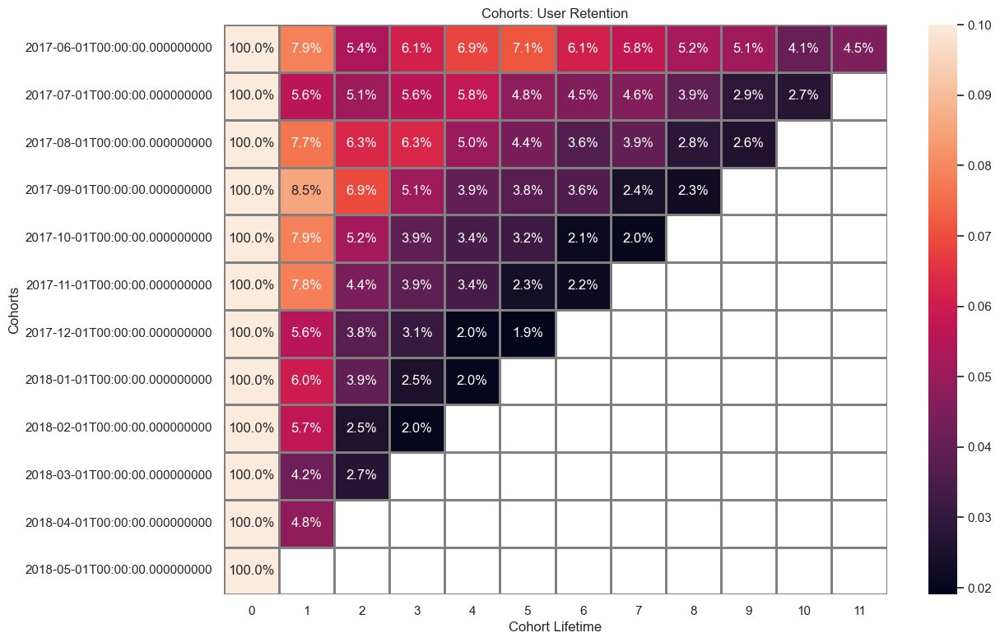

In [51]:
# Make a pivot table for cohorts
cohorts = visits.pivot_table(
    index='cohorts',
    columns='cohort_lifetime',
    values='uid',
    aggfunc='nunique',
)

# Make a retention pivot table
retention = cohorts.iloc[:,0:].div(cohorts[0], axis=0)

# Prepare heatmap for "cohorts: user retention' table
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: User Retention')
sns.heatmap(retention, annot=True, fmt='.1%', linewidths=1, vmax=0.1, linecolor='gray')
# Rotate the y-axis labels to be horizontal
plt.yticks(rotation=0)
# Add label titles
plt.ylabel('Cohorts')
plt.xlabel('Cohort Lifetime')

In [52]:
# Calculate overall retention by cohort lifetime
overall_retention = retention.mean(axis=0)
overall_retention

cohort_lifetime
0     1.000000
1     0.065167
2     0.046333
3     0.042760
4     0.040595
5     0.039444
6     0.036957
7     0.037509
8     0.035465
9     0.035159
10    0.034062
11    0.044951
dtype: float64

In [53]:
# Plot a line chart for 'overall_retention'
fig = px.line(
    overall_retention, 
    x=overall_retention.index, 
    y=overall_retention.values, 
    markers=True, 
    title='Overall Retention Rate by Cohort Lifetime', 
    labels={'cohort_lifetime': 'Cohort Lifetime', 
            'y': 'Retention Rate'}
)

# Show the plot
fig.show()

The first-month retention rate is decreasing until 4.2-8.5% for each new cohort. Then it slightly falls down until about 2%.<br/>
Retention rate is low and most of the users don't return after the first month.<br/> 
First cohort has higher retention during all the year. Retention falls down until 4.1% and then raises again until 4.5%.<br/>
According to the heatmap there was higher retention until December. We need to check if it affected sales.
Overall retention is low and with close meanings during the lifetime.

[Back to Contents](#back)

#### Product analysis conclusion <a id='conclusion_1'></a>

Product analysis included several steps:

* General user activity <br/>
    - How many people use it every day, week, and month?<br/>
* App usage frequency<br/>
    - How many sessions are there per day?<br/>
    - What is the length of each session?<br/>
    - What's the user retention rate? How often do users come back?<br/>

**********************
User activity data is very different and interesting to learn.<br/>
From the one side weekly and monthly sticky factors are quite good and Yandex Afisha looks quite popular.<br/> 
Each month most of the Yandex Afisha clients are new visitors.<br/>
From the other side more detailed analysis show that retention rate is low and most of the users don't return after the joining month.<br/>
DAU, WAU, MAU is higher from October 2017 till mid March 2018.<br/> 
Graphs look stable.<br/>

Daily sessions per user mostly distributed in the interval from 1.05 till 1.1.<br/>
On average, each user has approximately 1.28 sessions per month.<br/>
Daily amount of sessions per user more or less stable for the product.<br/> 
Visitors behavior has not change drusticaly during the year,<br/> that shows that DAU, WAU, MAU changes from Octomer, 2017 to mid March, 2018 should be due to the new users amount increase.<br/> 
DAU and sessions per user comparisson also confirms that.<br/>
There are anomalies in November and December, higher engagement, that could be caused by 'Black Friday' event and end of the year and New Year discounts.<br/>
Also people could buy New Year performances and concerts tickets that could increase people activity during November and December<br/>  
The lowest engagement is in August. It could be due to summer holliday period. There are less events in August.<br/>

Average session length (ASL) 643.47 sec.
Although ASL is 643.47 the most frequently occurring values in session duration are very low: 0, 60.<br/>
It means that most of the sessions are very short.<br/>

Sessions distribution and session duration distribution by device type shows that user engagement using desktop devices rather higher than using touch devices.
The mobile version of the site could be hard to use, so smartphone and tablet sessions end up being very short. <br/>

Comparisong of visits with duration by source id:
Source id 1 and Source id 2 are more attractive by users. It has higher engagement by users and also longer session duration than other sources.<br/> ASL for souce id 1 is higher than for source id 2.<br/>
Engagement by source 3 grown up from October 2017. Also we can see that ASL grown up.<br/>
Session per user by source 7 grown up to 2 in February 2018 (as it constantly 1).<br/>
Source id 10 significantly grown up from November, 2017 to March, 2018.<br/>
Source id 7 was removed since there is no more data after January, 2018. <br/>
We need to make deeper analysis by Source id to see orders by Source id and marketing expenses by Sorce id.

The first-month retention rate is decreasing until 4.2-8.5% for each new cohort. Then it slightly falls down until about 2%.<br/>
Retention rate is low and most of the users don't return after the first month.<br/> 
First cohort has higher retention during all the year. Retention falls down until 4.1% and then raises again until 4.5%.<br/>
According to the heatmap there was higher retention until December. We need to check if it affected sales.<br/>  
Overall retention is low and with close meanings during the lifetime.<br/>

*************************
**Recomendations:** <br/>
- Make user friendly mobile app with special app discount system to succedd in 'touch' area, or improve the current app. <br/>
- Product offer and discount policy should be updated to raise retention rate <br/>
- When customer choose any product we could add similar products at the bottom of the page to attract him and raise retention rate <br/>
- Make analytics of newsletter productivity

[Back to Contents](#back)

### Sales Analysis  <a id='sales_analysis'></a>

When do people start buying?<br/>
What is the average purchase size?<br/>
How much money do they bring? (LTV)<br/>

#### Conversion <a id='conversion'></a>

When do people start buying?<br/>

There are several steps to analyze the time that elapses between the first visit and conversion.

* Find visit number when the first order took place.
* Find the difference between the first order date and the first visit date.
* Analyze time to conversion distribution 


In [54]:
# What is the ratio of customers to all users? What is overall conversion?
# Overall conversion calculation
# Count unique users
all_users_count = visits['uid'].nunique()
# Count unique customers
customers_count = orders['uid'].nunique()
# Conversion count
conversion = (customers_count / all_users_count)
conversion = round(conversion, 2)
# Display result
print(f'Overall unique users: {all_users_count}')
print(f'Overall customers: {customers_count}')
print('The overall conversion is {:.1%}'.format(conversion))

Overall unique users: 228162
Overall customers: 36522
The overall conversion is 16.0%


In [55]:
# Find 'first_order' date by grouping orders df
first_order = orders.groupby('uid')['buy_ts'].min().reset_index(name='first_order_date')

In [56]:
# Add first visit and first order to orders dataframe
orders = pd.merge(orders, first_visit, how='left', on='uid')
orders = pd.merge(orders, first_order, how='left', on='uid')
# Display result
orders.head()

,buy_ts,revenue,uid,first_visit,first_order_date
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:09:00,2017-06-01 00:10:00
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:14:00,2017-06-01 00:25:00
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:25:00,2017-06-01 00:27:00
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:14:00,2017-06-01 00:29:00
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:31:00,2017-06-01 07:58:00


In [57]:
# Calculate average conversion time
orders['conversion'] = (orders['first_order_date'] - orders['first_visit']).dt.days

# Plot conversion time distribution
fig = px.histogram(orders, x="conversion", nbins=30)
fig.update_layout(
    title='Time that elapses between registration and conversion',
    xaxis_title='Time to conversion',
    yaxis_title='Distribution',
)
fig.show()

In [58]:
# Calculate conversion median
orders['conversion'].median()

np.float64(0.0)

In [59]:
# Display time to conversion distribution
orders['conversion'].value_counts(normalize=True).round(2)

conversion
0      0.68
1      0.04
2      0.02
4      0.01
3      0.01
       ... 
332    0.00
304    0.00
297    0.00
362    0.00
363    0.00
Name: proportion, Length: 345, dtype: float64

In [60]:
# Display time to conversion distribution
orders['conversion'].describe()

count    50414.000000
mean        17.420022
std         46.352685
min          0.000000
25%          0.000000
50%          0.000000
75%          4.000000
max        363.000000
Name: conversion, dtype: float64

In average it takes 0 days to convert for a user.<br/>
75% of users were converted within 4 days.<br/>
68% of customers with 0-day conversion.<br/>
The overall conversion is 16.0%.<br/>

[Back to Contents](#back)

#### Orders per customer<a id='orders_per_customer'></a>

How many orders do customers make during a given period of time?

In [61]:
# Make cohort analysis based on 'first_order' date
# Singling out Year.months from the columns 'first_order_date' and 'buy_ts'
# Add 'year.month' column to the orders DataFrame
orders['order_year.month'] = orders['buy_ts'].dt.strftime('%Y.%m') 
# Transfer 'year.month' column to datetime format
orders['order_year.month'] = pd.to_datetime(orders['order_year.month'], format='%Y.%m')
# Add 'first_order_year.month' column to the orders DataFrame
orders['first_order_year.month'] = orders['first_order_date'].dt.strftime('%Y.%m') 
# Transfer 'first_order_year.month' column to datetime format
orders['first_order_year.month'] = pd.to_datetime(orders['first_order_year.month'], format='%Y.%m')

# Display orders dataframe
orders.head()


,buy_ts,revenue,uid,first_visit,first_order_date,conversion,order_year.month,first_order_year.month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:09:00,2017-06-01 00:10:00,0,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:14:00,2017-06-01 00:25:00,0,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:25:00,2017-06-01 00:27:00,0,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:14:00,2017-06-01 00:29:00,0,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:31:00,2017-06-01 07:58:00,0,2017-06-01,2017-06-01


In [62]:
# Define cohort size. Group orders dataframe by 'first_order_year.month' and calculate number of customers
orders_cohorts_size = orders.groupby('first_order_year.month').agg({'uid': 'nunique'}).reset_index()
orders_cohorts_size.columns = ['first_order_year.month', 'cohort_size']

# Display cohorts size df
orders_cohorts_size

,first_order_year.month,cohort_size
0,2017-06-01,2023
1,2017-07-01,1923
2,2017-08-01,1370
3,2017-09-01,2581
4,2017-10-01,4340
5,2017-11-01,4081
6,2017-12-01,4383
7,2018-01-01,3373
8,2018-02-01,3651
9,2018-03-01,3533


In [63]:
# Form cohorts. Group orders dataframe by 'first_order_year.month' and 'order_year.month'
orders_cohorts = orders.groupby(['first_order_year.month', 'order_year.month']).agg({'uid': 'count'}).reset_index()
orders_cohorts.columns = ['first_order_year.month', 'order_year.month', 'n_orders']
# Add cohort size to orders cohorts
orders_cohorts = orders_cohorts.merge(orders_cohorts_size, on='first_order_year.month')
# Cohort lifetime calculation, in days
orders_cohorts['age'] = (orders_cohorts['order_year.month'] - orders_cohorts['first_order_year.month'])
# Define the conversion factor from days to months
days_in_month = 30.44
# Convert 'lifetime' from days to months
orders_cohorts['age'] = orders_cohorts['age'].dt.days
orders_cohorts['age'] = orders_cohorts['age'] / days_in_month
# Convert 'lifetime' to integer data type
orders_cohorts['age'] = orders_cohorts['age'].round().astype(int)
# Add 'cohorts' column to orders_cohorts df
orders_cohorts['cohorts'] = pd.to_datetime(orders_cohorts['first_order_year.month'], format='%Y.%m')
# Convert to datetime and then format to 'YYYY-MM'
orders_cohorts['order_year.month'] = pd.to_datetime(orders_cohorts['order_year.month'], format='%Y.%m').dt.strftime('%Y.%m')
orders_cohorts['first_order_year.month'] = pd.to_datetime(orders_cohorts['first_order_year.month'], format='%Y.%m').dt.strftime('%Y.%m')
# Calculate orders per customer
orders_cohorts['orders_per_customer']=(orders_cohorts['n_orders']/orders_cohorts['cohort_size']).round(2)
# Display cohorts df
orders_cohorts.head()

,first_order_year.month,order_year.month,n_orders,cohort_size,age,cohorts,orders_per_customer
0,2017.06,2017.06,2354,2023,0,2017-06-01,1.16
1,2017.06,2017.07,177,2023,1,2017-06-01,0.09
2,2017.06,2017.08,174,2023,2,2017-06-01,0.09
3,2017.06,2017.09,226,2023,3,2017-06-01,0.11
4,2017.06,2017.10,292,2023,4,2017-06-01,0.14


Text(0.5, 66.24999999999999, 'Cohort Lifetime')

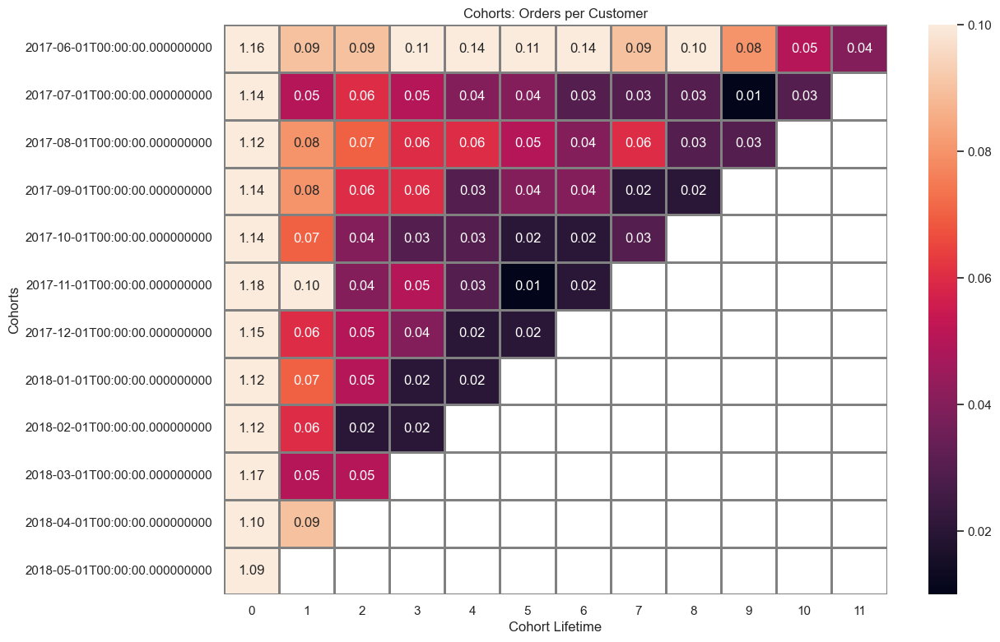

In [64]:
# Make a pivot table for orders per customer
orders_cohorts_pt = orders_cohorts.pivot_table(
    index='cohorts',
    columns='age',
    values='orders_per_customer',
    aggfunc='sum',
)

# Prepare heatmap for cohorts table
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: Orders per Customer')
sns.heatmap(orders_cohorts_pt, annot=True, fmt='.2f', linewidths=1, vmax=0.1, linecolor='gray') 
# Rotate the y-axis labels to be horizontal
plt.yticks(rotation=0)
# Add label titles
plt.ylabel('Cohorts')
plt.xlabel('Cohort Lifetime')

Text(0.5, 66.24999999999999, 'Cohort Lifetime')

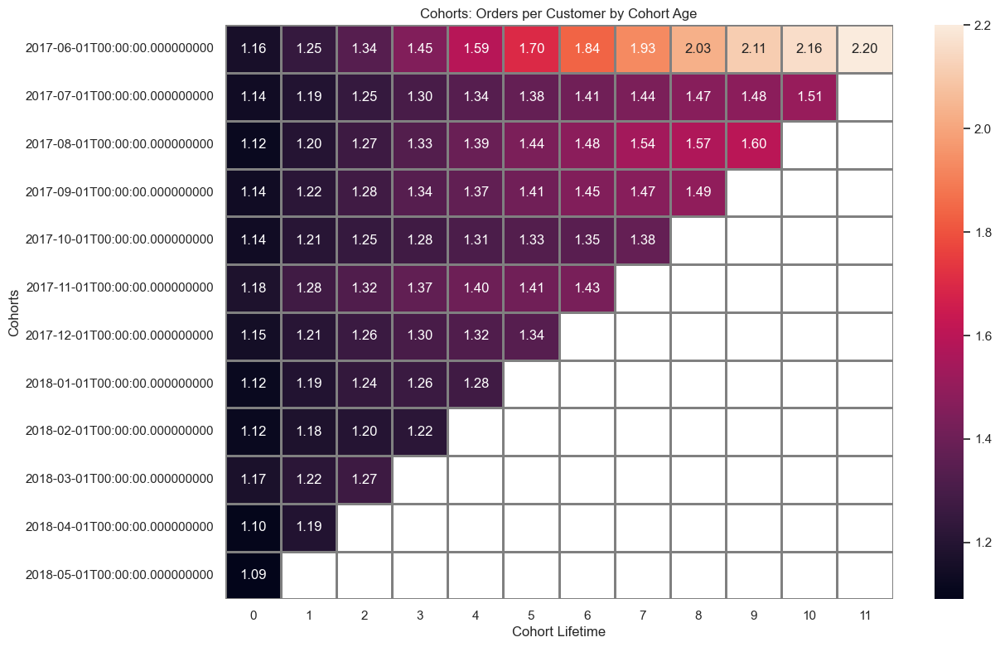

In [65]:
# Cumulative purchases per user by cohort
orders_cohorts_piv=orders_cohorts.pivot_table(
    index='cohorts',
    columns='age',
    values='orders_per_customer',
    aggfunc='sum'
).cumsum(axis=1)

# Prepare heatmap for cohorts table
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: Orders per Customer by Cohort Age')
sns.heatmap(orders_cohorts_piv, annot=True, fmt='.2f', linewidths=1, linecolor='gray') 
# Rotate the y-axis labels to be horizontal
plt.yticks(rotation=0)
# Add label titles
plt.ylabel('Cohorts')
plt.xlabel('Cohort Lifetime')

In average customers do little bit more than 1 order on the 0 month.<br/> 
After we have (decreasing) less and less buyers in cohort and than less orders.<br/> There is a need to check order size to ensure if we have bigger order size from month to month or it also decreases.<br/>
Orders per customer by cohort age grow up slowly.<br/>
Orders per customer by cohort age on the first cohort grows up till 2.2 orders per customer. <br/>
Other cohorts grow up rather slower that shows that there is tendency to less than 2 orders per customer during the given period.<br/>

[Back to Contents](#back)

#### Average purchase size <a id='purchase_size'></a>

In [66]:
# Plotting revenue distribution for each order
fig = px.histogram(orders, x="revenue", nbins=50)
fig.update_layout(
    title='Most of the Orders Revenue is Less than 50',
    xaxis_title='Revenue',
    yaxis_title='Distribution',
)
fig.show()

In [67]:
orders['revenue'].describe()

count    50414.000000
mean         4.999678
std         21.818574
min          0.000000
25%          1.220000
50%          2.500000
75%          4.890000
max       2633.280000
Name: revenue, dtype: float64

In [68]:
# Group orders by order_year.month to plot average revenue by month over time
revenue_over_time = orders.groupby('order_year.month')['revenue'].mean().reset_index(name='average_revenue')
# Add average revenue to orders dataframe
revenue_over_time_merged = orders.merge(revenue_over_time, on='order_year.month', how='left')

In [69]:
# Plotting average revenue over time
fig = px.line(revenue_over_time_merged, x="order_year.month", y="average_revenue", title='Average Revenue Over Time', labels={'average_revenue': 'Revenue', 'order_year.month': 'Month.Year'})
fig.show()

In [70]:
avg_purchase = orders['revenue'].mean().round(2)
print(f'Average revenue is {avg_purchase}')

Average revenue is 5.0


In [71]:
# Group orders by order_year.month to plot overall revenue over time
overall_revenue_over_time = orders.groupby('order_year.month')['revenue'].sum().reset_index(name='overall_revenue')
# Add average revenue to orders dataframe
overall_revenue_over_time_merged = orders.merge(overall_revenue_over_time, on='order_year.month', how='left')

In [72]:
# Plotting overall revenue over time
fig = px.line(overall_revenue_over_time_merged, x="order_year.month", y="overall_revenue", title='Overall Revenue Over Time', labels={'overall_revenue': 'Revenue', 'order_year.month': 'Month.Year'})
fig.show()

Most of the orders revenue is less than 50.<br/> 75% of orders with revenue less than 4.9.<br/>
Max revenue is 2633.28.<br/> 
Average purchase size is 5.0.<br/>
Average revenue over time has the highest peak in December 2017, the lowest average revenue is in June 2017 and then in Jan 2018.<br/>
Overall revenue over time grows up from September with a highest peak in December 2017.

In [73]:
# Cohort analyzes on average purchase size
# Form average revenue cohorts. Group orders dataframe by 'first_order_year.month' and 'order_year.month'
avg_revenue_cohorts = orders.groupby(['first_order_year.month', 'order_year.month'])['revenue'].mean().reset_index()
avg_revenue_cohorts.columns = ['first_order_year.month', 'order_year.month', 'avg_revenue']
# Cohort lifetime calculation, in days
avg_revenue_cohorts['age'] = (avg_revenue_cohorts['order_year.month'] - avg_revenue_cohorts['first_order_year.month'])
# Define the conversion factor from days to months
days_in_month = 30.44
# Convert 'lifetime' from days to months
avg_revenue_cohorts['age'] = avg_revenue_cohorts['age'].dt.days
avg_revenue_cohorts['age'] = avg_revenue_cohorts['age'] / days_in_month
# Convert 'lifetime' to integer data type
avg_revenue_cohorts['age'] = avg_revenue_cohorts['age'].round().astype(int)
# Add 'cohorts' column to orders_cohorts df
avg_revenue_cohorts['cohorts'] = pd.to_datetime(avg_revenue_cohorts['first_order_year.month'], format='%Y.%m')
# Convert to datetime and then format to 'YYYY-MM'
avg_revenue_cohorts['order_year.month'] = pd.to_datetime(avg_revenue_cohorts['order_year.month'], format='%Y.%m').dt.strftime('%Y.%m')
avg_revenue_cohorts['first_order_year.month'] = pd.to_datetime(avg_revenue_cohorts['first_order_year.month'], format='%Y.%m').dt.strftime('%Y.%m')
# Display cohorts df
avg_revenue_cohorts.head()

,first_order_year.month,order_year.month,avg_revenue,age,cohorts
0,2017.06,2017.06,4.060106,0,2017-06-01
1,2017.06,2017.07,5.547006,1,2017-06-01
2,2017.06,2017.08,5.088161,2,2017-06-01
3,2017.06,2017.09,8.545575,3,2017-06-01
4,2017.06,2017.10,7.084178,4,2017-06-01


Text(0.5, 66.24999999999999, 'Cohort Lifetime')

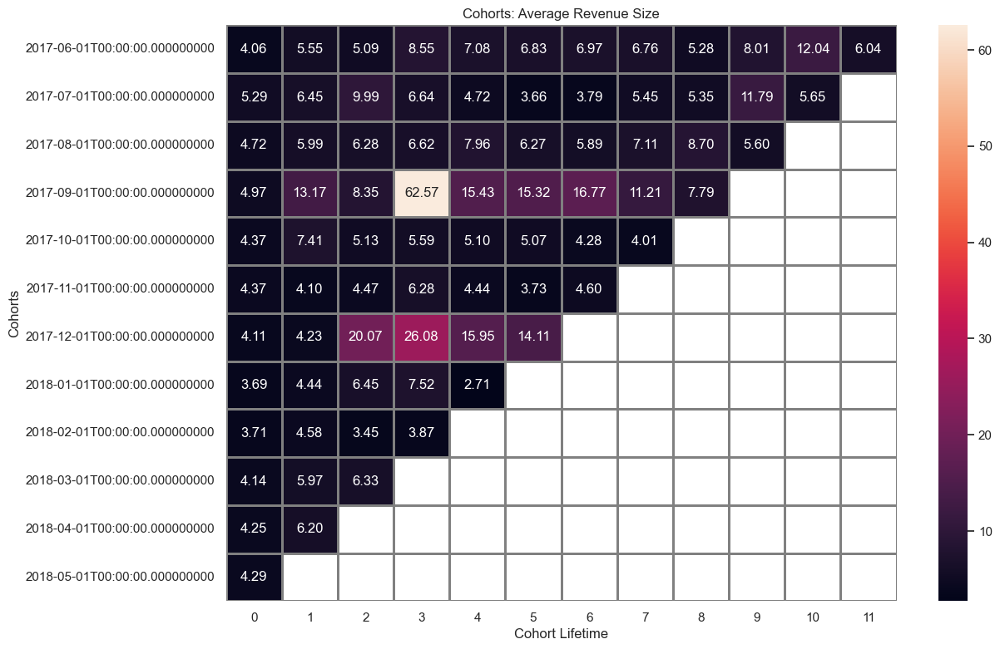

In [74]:
# Make a pivot table for average revenue cohorts
avg_revenue_cohorts_pt = avg_revenue_cohorts.pivot_table(
    index='cohorts',
    columns='age',
    values='avg_revenue',
    aggfunc='mean',
)

# Prepare heatmap for cohorts table
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: Average Revenue Size')
sns.heatmap(avg_revenue_cohorts_pt, annot=True, fmt='.2f', linewidths=1, linecolor='gray') 
# Rotate the y-axis labels to be horizontal
plt.yticks(rotation=0)
# Add label titles
plt.ylabel('Cohorts')
plt.xlabel('Cohort Lifetime')

What is the average purchase size?<br/>
We have analyzed average revenue size by cohort.<br/>
For most of the cohorts monthly average revenue grows up on the 1st month.<br/> 
In general, average revenue size changes wavelike during the year.<br/>
September and December cohorts have highly performance.<br/> September and December cohorts average revenue rather higher than other cohorts numbers.<br/>
June, July, August and January cohorts have significant growth of average revenue size in April. There could be good marketing campaign this month.<br/> 

[Back to Contents](#back)

#### Lifetime value <a id='ltv'></a>
How much money do customers bring?

In [75]:
# Cohort analyzes on LTV
# Form LTV cohorts. Group orders dataframe by 'first_order_year.month' and 'order_year.month'
ltv_cohorts = orders.groupby(['first_order_year.month', 'order_year.month'])['revenue'].sum().reset_index()
ltv_cohorts.columns = ['first_order_year.month', 'order_year.month', 'revenue']
# Add cohort size to orders cohorts
ltv_cohorts = ltv_cohorts.merge(orders_cohorts_size, on='first_order_year.month')
# Cohort lifetime calculation, in days
ltv_cohorts['age'] = (ltv_cohorts['order_year.month'] - ltv_cohorts['first_order_year.month'])
# Define the conversion factor from days to months
days_in_month = 30.44
# Convert 'lifetime' from days to months
ltv_cohorts['age'] = ltv_cohorts['age'].dt.days
ltv_cohorts['age'] = ltv_cohorts['age'] / days_in_month
# Convert 'lifetime' to integer data type
ltv_cohorts['age'] = ltv_cohorts['age'].round().astype(int)
# Add 'cohorts' column to orders_cohorts df
ltv_cohorts['cohorts'] = pd.to_datetime(ltv_cohorts['first_order_year.month'], format='%Y.%m')
# Convert to datetime and then format to 'YYYY-MM'
ltv_cohorts['order_year.month'] = pd.to_datetime(ltv_cohorts['order_year.month'], format='%Y.%m').dt.strftime('%Y.%m')
ltv_cohorts['first_order_year.month'] = pd.to_datetime(ltv_cohorts['first_order_year.month'], format='%Y.%m').dt.strftime('%Y.%m')
# LTV calculation
ltv_cohorts['ltv'] = (ltv_cohorts['revenue']/ltv_cohorts['cohort_size']).round(2)
# Display cohorts df
ltv_cohorts.info()
ltv_cohorts.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 78 entries, 0 to 77
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   first_order_year.month  78 non-null     object        
 1   order_year.month        78 non-null     object        
 2   revenue                 78 non-null     float64       
 3   cohort_size             78 non-null     int64         
 4   age                     78 non-null     int64         
 5   cohorts                 78 non-null     datetime64[ns]
 6   ltv                     78 non-null     float64       
dtypes: datetime64[ns](1), float64(2), int64(2), object(2)
memory usage: 4.4+ KB


,first_order_year.month,order_year.month,revenue,cohort_size,age,cohorts,ltv
0,2017.06,2017.06,9557.49,2023,0,2017-06-01,4.72
1,2017.06,2017.07,981.82,2023,1,2017-06-01,0.49
2,2017.06,2017.08,885.34,2023,2,2017-06-01,0.44
3,2017.06,2017.09,1931.30,2023,3,2017-06-01,0.95
4,2017.06,2017.10,2068.58,2023,4,2017-06-01,1.02


Text(0.5, 77.24999999999999, 'Cohort Lifetime')

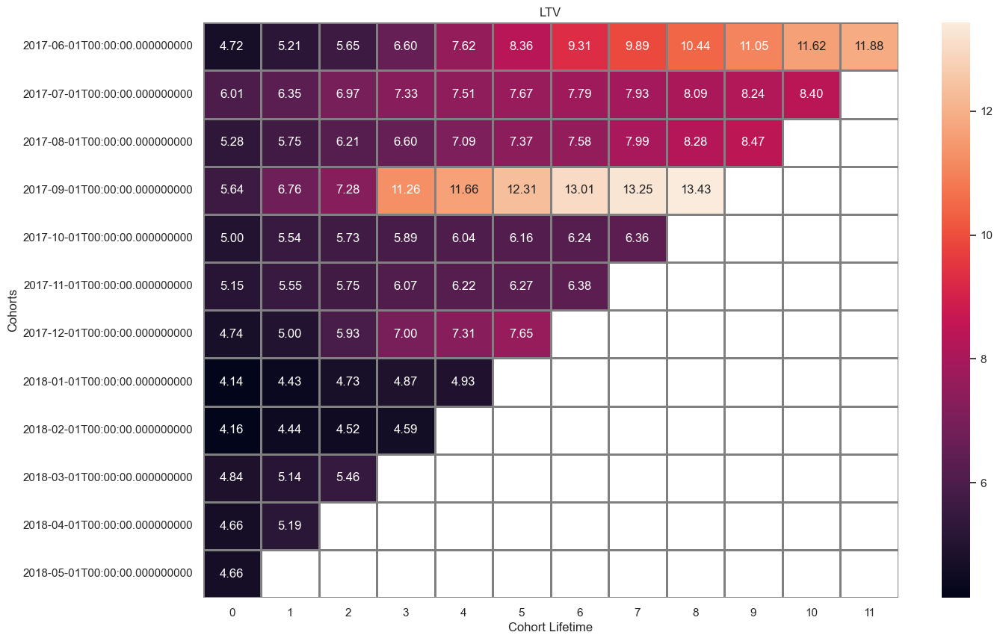

In [76]:
# Make a pivot table for LTV cohorts. Use cumsum, since LTV is cumulative metric.
ltv_cohorts_pt = ltv_cohorts.pivot_table(
    index='cohorts',
    columns='age',
    values='ltv',
    aggfunc='sum',
).cumsum(axis=1)

# Prepare heatmap for cohorts table
sns.set(style='white')
plt.figure(figsize=(15, 10))
plt.title('LTV')
sns.heatmap(ltv_cohorts_pt, annot=True, fmt='.2f', linewidths=1, linecolor='gray') 
# Rotate the y-axis labels to be horizontal
plt.yticks(rotation=0)
# Add label titles
plt.ylabel('Cohorts')
plt.xlabel('Cohort Lifetime')

September and June cohort have highest LTV.<br/>
September cohort has the best cumulative LTV after 3 months.<br/> LTV is 11.26 by the 3rd month.<br/>
June annual LTV is 11.88. September cohort reaches it almost by the 4th month.<br/> 
September cohort LTV by the 5th month becomes the highest.<br/>
Both September and June cohorts grow from December till May.<br/>
It could be caused by December sales, but also looks like it was 'higher' period, or results of marketing work.<br/>
January and February cohorts don't look profitable.

[Back to Contents](#back)

#### Sales analysis conclusion <a id='conclusion_2'></a>

Sales analysis based on several questions:

* When do people start buying?<br/>
* How many orders do customers make during a given period of time?<br/>
* What is the average purchase size?<br/>
* How much money do they bring? (LTV)<br/>

**********************

In average it takes 0 days to convert for a user.<br/>
75% of users were converted within 4 days.<br/>
68% of customers with 0-day conversion.<br/>
The overall conversion is 16%

Generally customers do little bit more than 1 order on the 0 month.<br/> 
After we have (decreasing) less and less buyers in cohort and than less orders.<br/> 
Orders per customer by cohort age grow up slowly.<br/>
Orders per customer by cohort age on the first cohort grows up till 2.2 orders per customer. <br/>
Other cohorts grow up rather slower that shows that there is tendency to less than 2 orders per customer during the given period.

What is the average purchase size?<br/>
Average purchase size is 5.0.<br/>
Average revenue over time has the highest peak in December 2017, the lowest average revenue is in June 2017 and then in Jan 2018.<br/>
We have analyzed average revenue size by cohort.<br/>
For most of the cohorts monthly average revenue grows up on the 1st month.<br/> 
In general, average revenue size changes wavelike during the year.<br/>
September and December cohorts have highly performance.<br/> September and December cohorts average revenue rather higher than other cohorts numbers.<br/>
June, July, August and January cohorts have significant growth of average revenue size in April. There could be good marketing campaign this month.<br/> 
Overall revenue over time grows up from September with a highest peak in December 2017.

September and June cohort have highest LTV.<br/>
September cohort has the best cumulative LTV after 3 months.<br/> LTV is 11.26 by the 3rd month.<br/>
June annual LTV is 11.88. September cohort reaches it almost by the 4th month.<br/> 
September cohort LTV by the 5th month becomes the highest.<br/>
Both September and June cohorts grow from December till May.<br/>
It could be caused by December sales, but also looks like it was 'higher' period, or results of marketing work.<br/>
January and February cohorts don't look profitable.

*************************
**Recomendations:** <br/>

* Find summer products to improve summer period sales (usually it is a low season).
* Push the marketing program for non-profitable cohorts.

[Back to Contents](#back)

### Marketing Analysis  <a id='marketing_analysis'></a>

How much money was spent? Overall, per source and over time.<br/>
How much did customer acquisition from each of the sources cost?<br/>
How worthwhile were the investments? (ROI)<br/>

[Back to Contents](#back)

#### Cost analysis <a id='cost'></a>

In [77]:
# Overall marketing cost calculation
print('Total marketing cost is {}'.format(costs['costs'].sum()))

Total marketing cost is 329131.62


In [78]:
# Cost by source_id
costs_by_source_id = costs.groupby('source_id')['costs'].sum().reset_index(name='costs')
costs_by_source_id

,source_id,costs
0,1,20833.27
1,2,42806.04
2,3,141321.63
3,4,61073.60
4,5,51757.10
5,9,5517.49
6,10,5822.49


In [79]:
# Plotting total costs by source id
fig = px.bar(costs_by_source_id, x='source_id', y='costs', title='Total Costs by Source id')
fig.show()

In [80]:
# Sorting cost for futher visualization
costs=costs.sort_values(by=['dt','source_id'])

In [81]:
# Plotting costs over time
fig = px.line(costs, x="dt", y="costs", color='source_id', title='Costs over time', labels={'costs': 'Costs', 'dt': 'Month.Year'})
fig.show()

In [82]:
# Group costs by date to visualize overall marketing costs over time
marketing_costs = costs.groupby('dt')['costs'].sum().reset_index(name='costs')
# Plotting costs over time
fig = px.line(marketing_costs, x="dt", y="costs", title='Marketing cost correlates with DAU/WAU/MAU indicators', labels={'costs': 'Costs', 'dt': 'Month.Year'})
fig.show()

There are 7 active marketing sources.<br/>
Sources 3 and 4 cost more. The most expensive is source id 3.<br/>
We spend less on marketing sources 9 and 10.<br/>
The highest cost peak is on 24.11.2017 (Source ids 9, 10, 5, 3, 2, 1). It looks like 'Black Friday' event with intensive advertising camaign.<br/> 
Highest peaks are on November - December due to the Black Friday and New Year hollidays.<br/>
The most intensive period with higher marketing costs is from October to the middle of April,<br/> and for mostc of the marketing sources average costs after April look the same with less cost jumps.<br/>
Each source have a high peak at the end.<br/>
Sources 9 and 10 have more peaks. Source 5 has 1 huge peak is on November, 24th, and there are no other significant cost jumps.<br/> 
There is also cost peak on the last analysis review date.<br/>
Source ids 1, 2 and 3 are similar - with one huge peak in November, 24th.<br/>
Source 4 has highest peaks on December, 5th and February 10th. The second date could be connected to St. Valentines day.<br/>

Marketing cost correlates with DAU/WAU/MAU indicators. There is even the same space and sharp decline in the end of the March - beginning of April.<br/>
Comparing marketing cost with overall revenue over time we see that there is a strong correlation. In summer marketing costs brought less revenue, but costs also were lower. <br/>
There is a revenue growth from September with a highest peak in December.<br/> Marketing costs peak was in the end of November that means that we see marketing campaign results in December.<br/>  

#### Customer aquisition cost <a id='cac'></a>

How much did customer acquisition from each of the sources cost?<br/>

In [84]:
# CAC by month calculation
# Add 'year.month' column to the costs DataFrame
costs['costs_year.month'] = costs['dt'].dt.strftime('%Y.%m') 
# Transfer 'year.month' column to datetime format
costs['costs_year.month'] = pd.to_datetime(costs['costs_year.month'], format='%Y.%m')
# Costs by month calculation. Group costs dataframe by month
costs_by_month = costs.groupby('costs_year.month')['costs'].sum().reset_index()
# Name dataframe columns
costs_by_month.columns = ['cost_month', 'marketing_cost']
# Display costs by month dataframe
costs_by_month

,cost_month,marketing_cost
0,2017-06-01,18015.00
1,2017-07-01,18240.59
2,2017-08-01,14790.54
3,2017-09-01,24368.91
4,2017-10-01,36322.88
5,2017-11-01,37907.88
6,2017-12-01,38315.35
7,2018-01-01,33518.52
8,2018-02-01,32723.03
9,2018-03-01,30415.27


In [85]:
# Customers per month calculation
customers_per_month = orders.groupby('order_year.month')['uid'].nunique().reset_index()
# Name dataframe columns 
customers_per_month.columns = ['cost_month', 'customers']
# Display dataframe
customers_per_month

,cost_month,customers
0,2017-06-01,2023
1,2017-07-01,1984
2,2017-08-01,1472
3,2017-09-01,2750
4,2017-10-01,4675
5,2017-11-01,4547
6,2017-12-01,4942
7,2018-01-01,3898
8,2018-02-01,4258
9,2018-03-01,4181


In [86]:
# Create cac_per_month dataframe merging costs_by_month and customers_per_month dataframes
cac_per_month = pd.merge(costs_by_month, customers_per_month, how='left', on=['cost_month'])
# Calculate CAC 
cac_per_month['cac'] = (cac_per_month['marketing_cost']/cac_per_month['customers']).round(2)
# Display dataframe
cac_per_month.head()

,cost_month,marketing_cost,customers,cac
0,2017-06-01,18015.00,2023,8.91
1,2017-07-01,18240.59,1984,9.19
2,2017-08-01,14790.54,1472,10.05
3,2017-09-01,24368.91,2750,8.86
4,2017-10-01,36322.88,4675,7.77


In [87]:
# Plot CAC over time
fig = px.line(cac_per_month, x="cost_month", y="cac", title='CAC Over Time')
fig.show()

CAC over time inversely proportional to DAU/WAU/MAU and revenue over time that confirms marketing effectiveness.  

In [88]:
Avg_CAC = (cac_per_month['marketing_cost'].sum()/cac_per_month['customers'].sum()).round(2)
print(f'Average CAC over time is {Avg_CAC}')

Average CAC over time is 8.02


In order to calculate CAC per source we need to know the original source of the user.<br/>
Each customer can come from different sources.<br/>
We define the first source that customer used as the original source of the user.<br/>

CAC per source calculation consists of following steps:<br/>
* Identify original source for visitors
* Add original source to orders table
* Calculate costs per source by month and customers per source by month
* Calculate CAC per source by month.

In [89]:
# User first source identification
first_source = visits.sort_values('start_ts').groupby('uid').first()['source_id'].reset_index(name = 'original_source')
first_source.head()

,uid,original_source
0,11863502262781,3
1,49537067089222,2
2,297729379853735,3
3,313578113262317,2
4,325320750514679,5


In [90]:
# Add original source to orders dataframe
orders = orders.merge(first_source, how='left', on='uid')
orders.head()

,buy_ts,revenue,uid,first_visit,first_order_date,conversion,order_year.month,first_order_year.month,original_source
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:09:00,2017-06-01 00:10:00,0,2017-06-01,2017-06-01,1
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:14:00,2017-06-01 00:25:00,0,2017-06-01,2017-06-01,2
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:25:00,2017-06-01 00:27:00,0,2017-06-01,2017-06-01,2
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:14:00,2017-06-01 00:29:00,0,2017-06-01,2017-06-01,2
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:31:00,2017-06-01 07:58:00,0,2017-06-01,2017-06-01,3


In [91]:
# Customers by original source by month calculation
customers_per_source_by_month = orders.groupby(['order_year.month', 'original_source'])['uid'].nunique().reset_index()
# Name dataframe columns 
customers_per_source_by_month.columns = ['cost_month', 'original_source', 'customers']
# Display dataframe
customers_per_source_by_month.head()

,cost_month,original_source,customers
0,2017-06-01,1,190
1,2017-06-01,2,235
2,2017-06-01,3,638
3,2017-06-01,4,413
4,2017-06-01,5,384


In [92]:
# CAC per source by month calculation
# Costs by month and by source calculation. Group costs dataframe by month
costs_by_month_per_source = costs.groupby(['costs_year.month', 'source_id'])['costs'].sum().reset_index()
# Name dataframe columns
costs_by_month_per_source.columns = ['cost_month', 'original_source', 'marketing_cost']
# Display costs by month dataframe
costs_by_month_per_source.head()

,cost_month,original_source,marketing_cost
0,2017-06-01,1,1125.61
1,2017-06-01,2,2427.38
2,2017-06-01,3,7731.65
3,2017-06-01,4,3514.80
4,2017-06-01,5,2616.12


In [93]:
# CAC per source by month calculation
# Create cac_per_month dataframe merging costs_by_month_by_source and customers_by_month_by_source dataframes
cac_per_source = pd.merge(costs_by_month_per_source, customers_per_source_by_month, how='left', on=['cost_month', 'original_source'])
# Rename dataframe columns
cac_per_source.columns = ['cost_month', 'source_id', 'marketing_cost', 'customers']
# Calculate CAC per source
cac_per_source['cac'] = (cac_per_source['marketing_cost']/cac_per_source['customers']).round(2)
# Display dataframe
cac_per_source.head()

,cost_month,source_id,marketing_cost,customers,cac
0,2017-06-01,1,1125.61,190,5.92
1,2017-06-01,2,2427.38,235,10.33
2,2017-06-01,3,7731.65,638,12.12
3,2017-06-01,4,3514.80,413,8.51
4,2017-06-01,5,2616.12,384,6.81


In [94]:
# Plotting cac dynamics
fig = px.line(cac_per_source, x="cost_month", y="cac",color='source_id',title='CAC dynamics', labels={'cac': 'CAC', 'cost_month': 'Month'})
fig.show()

In [95]:
# Average CAC per source calculation
# Group cac_per_source by source_id
avg_cac_per_source = cac_per_source.groupby('source_id').agg({'marketing_cost': 'sum', 'customers': 'sum'}).reset_index()
# Calculate CAC
avg_cac_per_source['cac'] = (avg_cac_per_source['marketing_cost']/avg_cac_per_source['customers']).round(2)
# Display average CAC per source
avg_cac_per_source.sort_values(by='cac', ascending=False)

,source_id,marketing_cost,customers,cac
2,3,141321.63,11590,12.19
1,2,42806.04,4246,10.08
4,5,51757.10,7618,6.79
0,1,20833.27,3405,6.12
3,4,61073.60,11363,5.37
6,10,5822.49,1412,4.12
5,9,5517.49,1383,3.99


Monthly CAC was higher in June - August and than decreased. <br/>
Average CAC over time is 8.02. <br/>
The highest CAC is for source id 3, 2 sources has low CAC - source id 10 and 9.
There is no CAC for 6, 7, 8 sources.<br/>

[Back to Contents](#back)

#### ROI <a id='roi'></a>
How worthwhile where the investments? (ROI)

##### ROI per cohort <a id='roi_per_cohort'></a>

In [96]:
# Combine CAC and LTV by cohorts to one dataframe.
# Add 'first_order_year.month' column to cac_per_month dataframe
cac_per_month['first_order_year.month'] = cac_per_month['cost_month'].dt.strftime('%Y.%m')
# Transfer 'year.month' column to datetime format
cac_per_month['first_order_year.month'] = pd.to_datetime(cac_per_month['first_order_year.month'], format='%Y.%m')
ltv_cohorts['first_order_year.month'] = pd.to_datetime(ltv_cohorts['first_order_year.month'], format='%Y.%m')
# Add CAC to LTV cohorts dataframe 
roi_per_cohorts = ltv_cohorts.merge(cac_per_month, how='left', on='first_order_year.month')
# Calculate ROI
roi_per_cohorts['roi'] = (roi_per_cohorts['ltv']/roi_per_cohorts['cac']).round(2)
# Display ROI per cohorts
roi_per_cohorts.head()

,first_order_year.month,order_year.month,revenue,cohort_size,age,cohorts,ltv,cost_month,marketing_cost,customers,cac,roi
0,2017-06-01,2017.06,9557.49,2023,0,2017-06-01,4.72,2017-06-01,18015.0,2023,8.91,0.53
1,2017-06-01,2017.07,981.82,2023,1,2017-06-01,0.49,2017-06-01,18015.0,2023,8.91,0.05
2,2017-06-01,2017.08,885.34,2023,2,2017-06-01,0.44,2017-06-01,18015.0,2023,8.91,0.05
3,2017-06-01,2017.09,1931.30,2023,3,2017-06-01,0.95,2017-06-01,18015.0,2023,8.91,0.11
4,2017-06-01,2017.10,2068.58,2023,4,2017-06-01,1.02,2017-06-01,18015.0,2023,8.91,0.11


Text(0.5, 66.24999999999999, 'Cohort Lifetime')

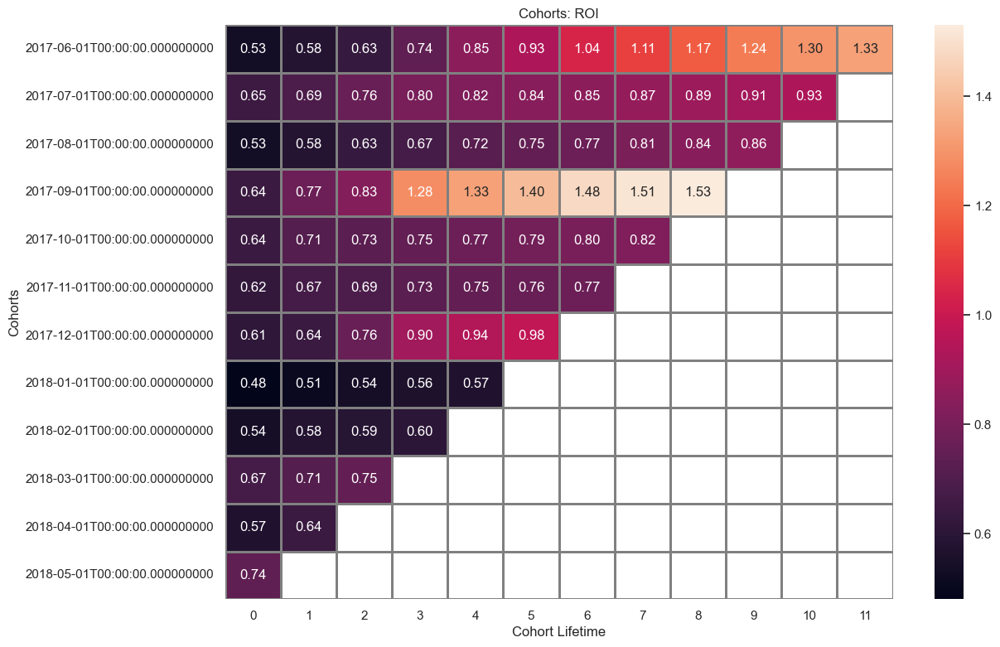

In [97]:
# Make a pivot table for ROI per cohorts
roi_per_cohorts_pt = roi_per_cohorts.pivot_table(
    index='cohorts',
    columns='age',
    values='roi',
    aggfunc='mean',
).cumsum(axis=1).round(2)

# Prepare heatmap for cohorts table
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: ROI')
sns.heatmap(roi_per_cohorts_pt, annot=True, fmt='.2f', linewidths=1, linecolor='gray') 
# Rotate the y-axis labels to be horizontal
plt.yticks(rotation=0)
# Add label titles
plt.ylabel('Cohorts')
plt.xlabel('Cohort Lifetime')

ROI = LTV/CAC. <br/> 
For most of the cohorts ROI < 1.<br/> 
This means that Yandex.Afisha losing money on customer acquisition and needs to reduce CAC or improve LTV.<br/>
June and September cohorts ROI is >1, also December cohort is about to approch 1.<br/>

[Back to Contents](#back)

##### ROI per source <a id='roi_per_source'></a>

Let's see if ROI per source will have a different picture

In [98]:
# ROI = LTV/CAC
# LTV per source calculation
ltv_per_source = orders.groupby('original_source').agg({'uid': 'nunique', 'revenue': 'sum'}).reset_index()
# Name columns
ltv_per_source.columns=['source_id','customers','revenue']
# LTV calculation
ltv_per_source['ltv'] = (ltv_per_source['revenue']/ltv_per_source['customers']).round(2)
# Display dataframe
ltv_per_source

,source_id,customers,revenue,ltv
0,1,2899,31090.55,10.72
1,2,3506,46923.61,13.38
2,3,10473,54511.24,5.20
3,4,10295,56693.41,5.51
4,5,6931,52624.02,7.59
5,7,1,1.22,1.22
6,9,1088,5759.40,5.29
7,10,1329,4450.33,3.35


In [99]:
cac_per_source_upd = avg_cac_per_source[['source_id', 'marketing_cost']]

In [100]:
roi_per_source = cac_per_source_upd.merge(ltv_per_source, on=['source_id'])
roi_per_source['cac'] = (roi_per_source['marketing_cost']/roi_per_source['customers']).round(2)
roi_per_source['romi']=roi_per_source['ltv']/roi_per_source['cac']
roi_per_source

,source_id,marketing_cost,customers,revenue,ltv,cac,romi
0,1,20833.27,2899,31090.55,10.72,7.19,1.490960
1,2,42806.04,3506,46923.61,13.38,12.21,1.095823
2,3,141321.63,10473,54511.24,5.20,13.49,0.385471
3,4,61073.60,10295,56693.41,5.51,5.93,0.929174
4,5,51757.10,6931,52624.02,7.59,7.47,1.016064
5,9,5517.49,1088,5759.40,5.29,5.07,1.043393
6,10,5822.49,1329,4450.33,3.35,4.38,0.764840


In [101]:
fig = px.bar(roi_per_source, x='source_id', y='romi', title='ROMI per source', labels={'romi': 'ROMI', 'source_id': 'Source id'})
fig.update_xaxes(type='category')
fig.show()

ROMI per source gives us a different picture.<br/>
Source id 1 is profitable and it's ROMI is about 1.5.<br/>
Other ROMI is about 1 or lower. <br/>
Sources id 2, 5 and 9 are higher than 1. There is mostly n profit on these sources.
Sources 3, 4, 10 are loss making. Those 3 sources need to be analysed to understand if there is a need to continue working with it.  

[Back to Contents](#back)

#### Marketing analysis conclusion <a id='#conclusion_3'></a>

Marketing analysis are rooted in the several questions:

* How much money was spent? Overall, per source and over time.<br/>
* How much did customer acquisition from each of the sources cost?<br/>
* How worthwhile were the investments? (ROI)<br/>

**********************

Total marketing cost is 329131.62.<br/>
There are 7 active marketing sources.<br/>
Sources 3 and 4 cost more. The most expensive is source id 3.<br/>
We spend less on marketing sources 9 and 10.<br/>

The highest cost peak is on 24.11.2017 (Source ids 9, 10, 5, 3, 2, 1). It looks like 'Black Friday' event with intensive advertising camaign.<br/> 
Highest peaks are on November - December due to the Black Friday and New Year hollidays.<br/>
The most intensive period with higher marketing costs is from October to the middle of April,<br/> and for mostc of the marketing sources average costs after April look the same with less cost jumps.<br/>
Each source have a high peak at the end.<br/>
Sources 9 and 10 have more peaks. Source 5 has 1 huge peak is on November, 24th, and there are no other significant cost jumps.<br/> 
There is also cost peak on the last analysis review date.<br/>
Source ids 1, 2 and 3 are similar - with one huge peak in November, 24th.<br/>
Source 4 has highest peaks on December, 5th and February 10th. The second date could be connected to St. Valentines day.<br/>

Marketing cost correlates with DAU/WAU/MAU indicators. There is even the same space and sharp decline in the end of the March - beginning of April.<br/>
Comparing marketing cost with overall revenue over time we see that there is a strong correlation. In summer marketing costs brought less revenue, but costs also were lower. <br/>
There is a revenue growth from September with a highest peak in December.<br/> Marketing costs peak was in the end of November that means that we see marketing campaign results in December.<br/>  

CAC over time inversely proportional to DAU/WAU/MAU and revenue over time that confirms marketing effectiveness.<br/>  
Monthly CAC was higher in June - August and then decreased. <br/>
Average CAC over time is 8.02. <br/>
The highest CAC is for source id 3, 2 sources has low CAC - source id 10 and 9.
There is no CAC for 6, 7, 8 sources.<br/>

ROI = LTV/CAC. <br/> 
For most of the cohorts ROI < 1.<br/> 
This means that Yandex.Afisha losing money on customer acquisition and needs to reduce CAC or improve LTV.<br/>
June and September cohorts ROI is >1, also December cohort is about to approch 1.<br/>

ROMI per source gives us a different picture.<br/>
Source id 1 is profitable and it's ROMI is about 1.5.<br/>
Other ROMI is about 1 or lower. <br/>
Sources id 2, 5 and 9 are higher than 1. There is mostly no profit on these sources.
Sources 3, 4, 10 are loss making. Those 3 sources need to be analysed to understand if there is a need to continue working with it or we need to terminate these sources .  

*************************
**Recomendations:** <br/>

* Check ROMI for non profitable sources against CAC and LTV
* Give recomendations what source should we increase the flow from and which should we cut out.

[Back to Contents](#back)

### Conclusions <a id='#data_analysis_conclusions'></a>

Checking total costs by source id we see that source id 3 has the highest costs. It should be terminated ASAP.<br/>
Source id 4 costs are higher than other sources. Source id 10 costs are low.<br/>
CAC for source id 4 became lower by the end of the period.<br/>
Average CAC for source id 10 is one of the lowest.<br/>
The same with LTV per source for source id 10.<br/>
There is nothing that shows importance to continue working with these sources. It should be eliminated as well as source id 3.<br/>

[Back to Contents](#back)

## Findings and recomendations <a id='end'></a>

**Findings:**<br/>

**Customer loyalty:**<br/>
From visitors activity analysis Yandex Afisha appears to be quite common. Weekly and monthly sticky factors are decent.<br/> 
Each month most of the Yandex Afisha clients are new visitors.<br/>
From the other side more detailed analysis show that retention rate is low and most of the users don't return after the joining month.<br/>
Low retention rates indicate that users don't find enough value to return, or there might be issues with user experience, product fit, or marketing alignment.<br/>
The first-month retention rate is decreasing until 4.2-8.5% for each new cohort. Then it slightly falls down until about 2%.<br/>
Overall retention is low and with close meanings during the lifetime.<br/>
The overall conversion is pretty good - 16%.<br/>
In average it takes 0 days to convert for a user.<br/>

Generally customers do little bit more than 1 order on the 0 month.<br/> 
After we have (decreasing) less and less buyers in cohort and than less orders.<br/> 
Orders per customer by cohort age grow up slowly with a tendency to less than 2 orders per customer during the given period.<br/>

Sessions distribution and session duration distribution by device type show that user engagement using desktop devices rather higher than using touch devices. <br/>
The mobile version of the site could be hard to use, so smartphone and tablet sessions end up being very short. <br/>

**Cohort Analisis:**<br/>
We have analyzed average revenue size, LTV and ROI by cohort.<br/>

Cohorts with better performance - September, June and December cohorts.<br/>
September and December cohorts average revenue rather higher than other cohorts numbers.<br/>
September and June cohort have highest LTV.<br/>
September cohort has the best cumulative LTV after 3 months, by the 5th month September LTV becomes the highest.<br/> 
Both September and June cohorts grow from December till May.<br/>
June and September cohorts ROI is >1, also December cohort is about to approch 1.<br/>

The least successfule cohorts:<br/>
October and November cohorts has less deviations and less profitable.<br/>
January and February cohorts don't look profitable.<br/>
For most of the cohorts ROI < 1.<br/> 
This means that Yandex.Afisha losing money on customer acquisition and needs to reduce CAC or improve LTV.<br/>

**Indicators change over time:**<br/>
High period for visits, sales and marketing is from September 2017 till mid April 2018.<br/>

DAU, WAU, MAU is higher from October 2017 till mid March 2018 (new users amount increase).<br/> 
The most intensive period with higher marketing costs is from October to the middle of April<br/>
There is a revenue growth from September with a highest peak in December.<br/>
Marketing cost correlates with DAU/WAU/MAU indicators. There is even the same space and sharp decline in the end of the March - beginning of April.<br/>
There is also strong correlation with overall revenue over time. In summer marketing costs brought less revenue, but costs also were lower. <br/>
CAC over time inversely proportional to DAU/WAU/MAU and overall revenue over time that confirms marketing effectiveness.<br/>  
Monthly CAC was higher in June - August and then decreased. <br/>
There was higher retention until December, that did not affected sales.<br/>

There are anomalies in November and December, higher engagement, revenue and marketing peaks. <br/>
Revenue highest peak is in December.<br/> The highest marketing costs peak was in the end of November, on 24.11.2017, that means that we see marketing campaign results in December.<br/>  
The highest marketing cost peaks are on November - December.<br/> 
These anomalies could be caused by 'Black Friday' event and end of the year and New Year discounts.<br/> Also people could buy New Year performances and concerts tickets that could increase people activity during November and December<br/> 
There is also significant average revenue size growtn in several cohorts in April that could be caused by effective marketing campaign.<br/>  
The lowest engagement is in August. It could be due to summer holliday period. There are less events in August.<br/> 

**Marketing sources analisis:**<br/>
There are 7 active marketing sources.<br/>
Analisis based on ROMI, since this characteristic shows how effective marketing spend was, and helps to decide whether to continue, increase, or reduce marketing investments.

Source id 1 is profitable and it's ROMI is about 1.5.<br/>
Other ROMI is about 1 or lower. <br/>
Sources id 2, 5 and 9 are higher than 1. There is mostly no profit on these sources.<br/>
Sources 3, 4, 10 are loss making. Those 3 sources need to be analysed to understand if there is a need to continue working with it or we need to terminate these sources.<br/>

- Source id 1 and Source id 2 are more attractive by users. It has higher engagement by users and also longer session duration than other sources.<br/> 
- Sources 3 and 4 cost more than other sources. The most expensive is source id 3.<br/>
- CAC for source id 4 became lower by the end of the period.<br/>
- Source id 7 was removed since there is no more data after January, 2018. <br/>
- Source id 10 significantly grown up from November, 2017 to March, 2018.<br/>
We spend less on marketing sources 9 and 10.<br/>
Sources 9 and 10 have more peaks, also they have the lowest CAC.<br/>
Source id 10 LTV is also low.<br/>
    
*************************
**Recomendations:** <br/>
- As cost id.3 has the highest cost and low ROMI it should be terminated ASAP. <br/>
- Source ids 4 and 10 should be cuted out too since it is not profitable.<br/>
- Make user friendly mobile app with special app discount system to succedd in 'touch' area, or improve the current app. <br/>
- Product offer and discount policy should be updated to raise retention rate. <br/>
- When customer choose any product we could add similar products at the bottom of the page to attract him and raise retention rate. <br/>
- Make analytics of newsletter productivity.<br/>
- Find summer products to improve summer period sales (usually it is a low season).<br/>
- Push the marketing campaign for non-profitable cohorts.<br/>
- We should increase the flow for source ids 1 and 2 since it has high LTV by 140K from eliminated source id 3 - 90K for source id 1 and 50K to source id 2 respectively. <br/>
- Sorce ids 5 and 9 flows should be increased by 30K and 30K respectively from eliminated source id.4 saving.<br/>

[Back to Contents](#back)